## 0. Import Packages

In [1]:
path='G:/Shared drives/BeStarsMiMeS/UpdatedFiles/' #Patrick's google file stream path

In [2]:
import LSDpy.lsdpy as lsdpy

In [3]:
import specpolFlow as pol
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
import astropy.constants as const
from matplotlib.backends.backend_pdf import PdfPages

In [4]:
import pandas as pd
sheet_id = '1M6y1Wnsrc-w5FjUMfKaSFa_-foIDAaMe8W4lYNWnWyk'
sheet_name = 'Stars'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
StarData=pd.read_csv(url)

sheet_name = 'Observations'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
Observations=pd.read_csv(url)

In [5]:
import itertools

### This gets rid of the warnings in the cells where it is creating more than 20 figures (i.e. 1.2)
#### Not needed for this notebook but could be useful in the future
#import warnings
#warnings.filterwarnings("default", message="More than 20 figures have been opened.")


## 1.0 Single Star

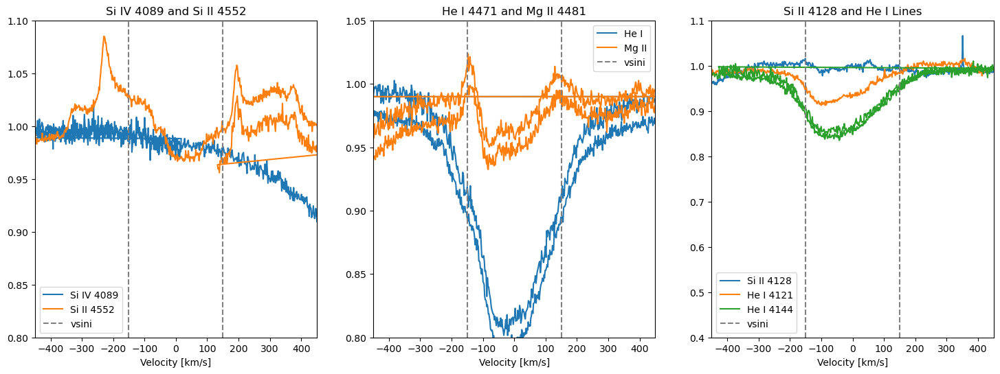

In [66]:
models1=['normalized_SuperCleanAsif+tellClean','hybrid_SuperCleanAsif+tellClean','hybrid_maskdepth0.02_tellClean']

star='HD7636'
ModelCode='T15000G40'
i=0
j=1
df = pd.read_csv('{}03-LSD-calculations/LSD/Params-LSDProfiles-CalculatedByPython.csv'.format(path))
velS = df["VelStart"][j]
velE = df["VelEnd"][j]
velP = df["VelPixel"][j]
vsini=StarData['vsini-estimate'][j]


#get Full Mask with all lines
AFfile_mask='{}02-Mask-calculations/MaskCleaning/depth0.02_tellClean/{}_depth0.02.mask'.format(path,ModelCode)
AFmask = pol.read_mask(fname=AFfile_mask)
#get SuperClean Mask with all Lines
AUfile_mask='{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}.mask'.format(path,star,i+1)
AUmask = pol.read_mask(fname=AUfile_mask)

#get observed spectra file
file = '{}00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(path,star,i+1)
data = pol.read_spectrum(file)
#get synthetic spectra file
synthfile = '{}01-Synth-calculations/Synth-hybrid-spectra/{}_{}_noise.s'.format(path,star,i+1)
synth = pol.read_spectrum(synthfile)


outfile='{}11-MaskComparison/{}_{}.lsd'.format(path,star,i+1)

"""hybridFull = lsdpy.main(observation=synthfile, mask=AFfile_mask, outName=outfile, 
        velStart=velS, velEnd=velE, velPixel=velP, 
        normDepth=0.2, normLande=1.2, normWave=500.0,
        removeContPol=1, trimMask=0, sigmaClipIter=0, sigmaClip=500, 
        interpMode=1, fSaveModelS=1, outModelName='',
        fLSDPlotImg=0, fSavePlotImg=0, outPlotImgName='')

normSuper = lsdpy.main(observation=file, mask=AUfile_mask, outName=outfile, 
        velStart=velS, velEnd=velE, velPixel=velP, 
        normDepth=0.2, normLande=1.2, normWave=500.0,
        removeContPol=1, trimMask=0, sigmaClipIter=0, sigmaClip=500, 
        interpMode=1, fSaveModelS=1, outModelName='',
        fLSDPlotImg=0, fSavePlotImg=0, outPlotImgName='')

hybridSuper = lsdpy.main(observation=synthfile, mask=AUfile_mask, outName=outfile, 
        velStart=velS, velEnd=velE, velPixel=velP, 
        normDepth=0.2, normLande=1.2, normWave=500.0,
        removeContPol=1, trimMask=0, sigmaClipIter=0, sigmaClip=500, 
        interpMode=1, fSaveModelS=1, outModelName='',
        fLSDPlotImg=0, fSavePlotImg=0, outPlotImgName='')
"""
fig, ax = plt.subplots(1,3,sharex=False,figsize=(18,6))

SiIV4089 = 408.9 * u.nm
SiIVvel = ((data.wl*u.nm - SiIV4089)/SiIV4089 * const.c).to(u.km/u.s)

SiII4552 = 455.2*u.nm
vel6=((data.wl*u.nm - SiII4552)/SiII4552 * const.c).to(u.km/u.s)

ax[0].plot(SiIVvel,data.specI,label='Si IV 4089')
ax[0].plot(vel6,data.specI,label='Si II 4552')
ax[0].set_xlim(-3*vsini,3*vsini)
ax[0].set_ylim(0.8,1.1)
ax[0].vlines([-vsini,vsini],0.8,1.1,linestyle='--',color='grey',label='vsini')
ax[0].legend()
ax[0].set_title('Si IV 4089 and Si II 4552')
ax[0].set_xlabel('Velocity [km/s]')

HeI4471 = 447.1 *u.nm
MgII4481 = 448.1 *u.nm
HeIvel = ((data.wl*u.nm - HeI4471)/HeI4471 * const.c).to(u.km/u.s)
MgIIvel = ((data.wl*u.nm - MgII4481)/MgII4481 * const.c).to(u.km/u.s)

ax[1].plot(HeIvel,data.specI,label='He I')
ax[1].plot(MgIIvel,data.specI,label='Mg II')
ax[1].set_xlim(-3*vsini,3*vsini)
ax[1].set_ylim(0.8,1.05)
ax[1].vlines([-vsini,vsini],0.8,1.05,linestyle='--',color='grey',label='vsini')
ax[1].legend()
ax[1].set_title('He I 4471 and Mg II 4481')
ax[1].set_xlabel('Velocity [km/s]')

HeI4009 = 400.9*u.nm
HeI4026 = 402.6*u.nm
HeI4121 = 412.1*u.nm
HeI4144 = 414.4*u.nm
HeI4924 = 492.4*u.nm

SiII4128 = 412.8*u.nm


vel=((data.wl*u.nm - HeI4009)/HeI4009 * const.c).to(u.km/u.s)
vel1=((data.wl*u.nm - HeI4026)/HeI4026 * const.c).to(u.km/u.s)
vel2=((data.wl*u.nm - HeI4121)/HeI4121 * const.c).to(u.km/u.s)
vel3=((data.wl*u.nm - HeI4144)/HeI4144 * const.c).to(u.km/u.s)
vel4=((data.wl*u.nm - HeI4924)/HeI4924 * const.c).to(u.km/u.s)

vel5=((data.wl*u.nm - SiII4128)/SiII4128 * const.c).to(u.km/u.s)

ax[2].plot(vel5,data.specI,label='Si II 4128')
ax[2].plot(vel2,data.specI,label='He I 4121')
ax[2].plot(vel3,data.specI,label='He I 4144')

ax[2].set_xlim(-3*vsini,3*vsini)
ax[2].set_ylim(0.4,1.1)
ax[2].vlines([-vsini,vsini],0.4,1.1,linestyle='--',color='grey',label='vsini')
ax[2].legend()
ax[2].set_title('Si II 4128 and He I Lines')
ax[2].set_xlabel('Velocity [km/s]')


plt.show()


57
[8.   8.01]


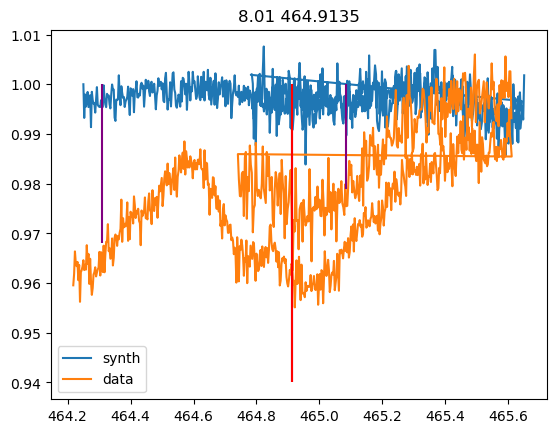

In [64]:
i=8.
j=20
wl=AFmask[np.where((AFmask.iuse==1)&(AFmask.element>=i)&(AFmask.element<i+1))].wl
depth=AFmask[np.where((AFmask.iuse==1)&(AFmask.element>=i)&(AFmask.element<i+1))].depth
vel3=((data.wl*u.nm - wl[j]*u.nm)/(wl[j]*u.nm) * const.c).to(u.km/u.s)
flux3=synth.specI[np.where((vel3*u.s/u.km>=-3*vsini) & (vel3*u.s/u.km <=3*vsini))]
flux4=data.specI[np.where((vel3*u.s/u.km>=-3*vsini) & (vel3*u.s/u.km <=3*vsini))]
velocity3=vel3[np.where((vel3*u.s/u.km>=-3*vsini) & (vel3*u.s/u.km <=3*vsini))]*u.s/u.km
wave=synth.wl[np.where((vel3*u.s/u.km>=-3*vsini)&(vel3*u.s/u.km<3*vsini))]
wave2=data.wl[np.where((vel3*u.s/u.km>=-3*vsini)&(vel3*u.s/u.km<3*vsini))]

print(len(wl))
print(np.unique(AFmask[np.where((AFmask.iuse==1)&(AFmask.element>=i)&(AFmask.element<i+1))].element))
plt.plot(wave,flux3,label='synth')
plt.plot(wave2,flux4,label='data')
plt.title('{} {}'.format(AFmask[np.where((AFmask.iuse==1)&(AFmask.element>=i)&(AFmask.element<i+1))].element[j], wl[j]))
plt.legend()
plt.vlines(AFmask[np.where((AFmask.iuse==1)&(AFmask.wl>=wave.min())&(AFmask.wl<wave.max()))].wl,1-AFmask[np.where((AFmask.iuse==1)&(AFmask.wl>=wave.min())&(AFmask.wl<wave.max()))].depth,1,color='purple')
plt.vlines(wl[j],1-depth[j],1,color='red')
#OII 4642, OII 4649, OI 5329
#SiII 4131, 

(0.8, 1.05)

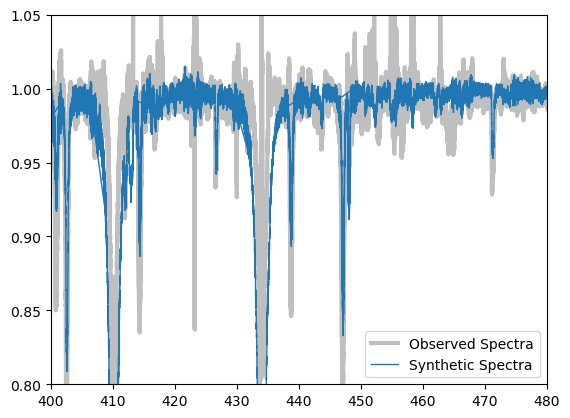

In [11]:

plt.plot(data.wl,data.specI,label='Observed Spectra',color='grey',alpha=0.5,linewidth=3)
plt.plot(synth.wl,synth.specI,label='Synthetic Spectra',color='C0',alpha=1,linewidth=1)
#plt.plot(hybridFull[8][0],hybridFull[8][1], label='Model Spectra (Full Hybrid)')
#plt.plot(toto[8][0],toto[8][1], label='Model Spectra (SuperClean Observed)')
#plt.plot(toto2[8][0],toto2[8][1], label='Model Spectra (SuperClean Hybrid)')


#plt.vlines(mask[np.where((mask.iuse==1) & (mask.element==2.))].wl,1,1.05,label='He Lines',color='Red')
plt.legend()
plt.xlim(400,480)
plt.ylim(0.8,1.05)

In [ ]:
OI 436.8242
OII 464.181

In [ ]:
NOI=8
NOII=11

800.6737387679225 887.6411235957954


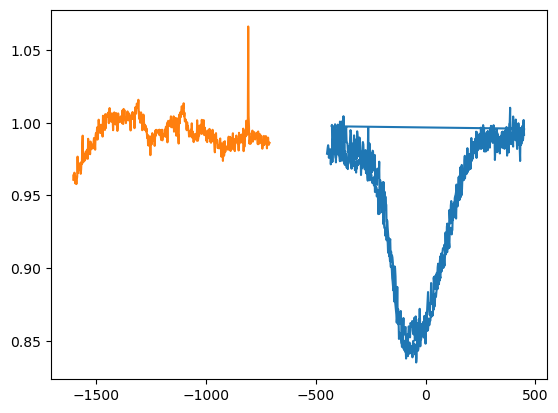

In [80]:
vel3=((data.wl*u.nm - HeI4144)/HeI4144 * const.c).to(u.km/u.s)
flux3=data.specI[np.where((vel3*u.s/u.km>=-3*vsini) & (vel3*u.s/u.km <=3*vsini))]
velocity3=vel3[np.where((vel3*u.s/u.km>=-3*vsini) & (vel3*u.s/u.km <=3*vsini))]*u.s/u.km

vel5=((data.wl*u.nm - SiII4128)/SiII4128 * const.c).to(u.km/u.s)
flux5=data.specI[np.where((vel5*u.s/u.km>=-3*vsini) & (vel5*u.s/u.km <=3*vsini))]
velocity5=vel3[np.where((vel5*u.s/u.km>=-3*vsini) & (vel5*u.s/u.km <=3*vsini))]*u.s/u.km

plt.plot(velocity3,flux3)
plt.plot(velocity5,flux5)

print(np.trapz(flux3,velocity3),np.trapz(flux5,velocity5))

In [7]:
star='hd7636'
vsini=170
ModelCode='T18000G40'
vradCorrected=-30 *u.km/u.s

file = '{}00-InputMaterial/NormalizedSpectra/{}_1.s'.format(path,star)
data = pol.read_spectrum(file)

synthfile = '{}10-Spectra-Data-vs-hybrid-plots and Halpha and TESS/SpectraCorrections/{}/{}_{}_{}.s'.format(path,star,star,ModelCode,vsini)
synth = pol.read_spectrum(synthfile)

fullfile_mask='{}10-Spectra-Data-vs-hybrid-plots and Halpha and TESS/SpectraCorrections/{}/{}_{}.mask'.format(path,star,ModelCode,vsini)
mask = pol.read_mask(fname=fullfile_mask)

file_mask='{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}.mask'.format(path,star,1)
mask = pol.read_mask(fname=file_mask)

outfile_AUO='{}10-Spectra-Data-vs-hybrid-plots and Halpha and TESS/SpectraCorrections/{}/{}_{}_{}_UO.lsd'.format(path,star,star,ModelCode,vsini)
toto = lsdpy.main(observation=file, mask=file_mask, outName=outfile_AUO, 
        velStart=velS, velEnd=velE, velPixel=velP, 
        normDepth=0.2, normLande=1.2, normWave=500.0,
        removeContPol=1, trimMask=0, sigmaClipIter=0, sigmaClip=500, 
        interpMode=1, fSaveModelS=1, outModelName='',
        fLSDPlotImg=0, fSavePlotImg=0, outPlotImgName='')
AUO=pol.read_lsd(outfile_AUO)

outfile_AUH='{}10-Spectra-Data-vs-hybrid-plots and Halpha and TESS/SpectraCorrections/{}/{}_{}_{}_UH.lsd'.format(path,star,star,ModelCode,vsini)
toto2 = lsdpy.main(observation=synthfile, mask=file_mask, outName=outfile_AUH, 
        velStart=velS, velEnd=velE, velPixel=velP, 
        normDepth=0.2, normLande=1.2, normWave=500.0,
        removeContPol=1, trimMask=0, sigmaClipIter=0, sigmaClip=500, 
        interpMode=1, fSaveModelS=1, outModelName='',
        fLSDPlotImg=0, fSavePlotImg=0, outPlotImgName='')
AUH = pol.read_lsd(outfile_AUH)

Average observed spec velocity spacing: 1.806393 km/s
using a 121 point profile with 7.500000 km/s pixels
mean mask depth 0.069414 wl 497.931 Lande 1.212916 (from 454 lines)
mean mask norm weightI 0.347070 weightV 0.330822
saving model spectrum to  ...
I reduced chi2 43.5048 (chi2 3739024.26 constraints 86066 dof 121)
 Rescaling error bars by: 6.595821
V reduced chi2 1.0975 (chi2 94321.96 constraints 86066 dof 121)
 Rescaling error bars by: 1.047601
 removing profile continuum pol: -2.4382e-05 +/- 1.1054e-08 (avg err 1.0496e-04)
N1 reduced chi2 1.1114 (chi2 95515.01 constraints 86066 dof 121)
 Rescaling error bars by: 1.054206
 removing profile continuum pol: -2.6516e-05 +/- 1.1194e-08 (avg err 1.0562e-04)
line range estimate -217.5 142.5 km/s
V in line reduced chi^2 0.712718 (chi2  34.210467) 
 detect prob 0.066724 (fap 9.332763e-01)
 Non-detection V (fap 9.332763e-01)
 V outside line reduced chi^2 0.837255 (chi2  56.096107) 
 detect prob 0.173589 (fap 8.264111e-01)
N1 in line reduced

(0.8, 1.05)

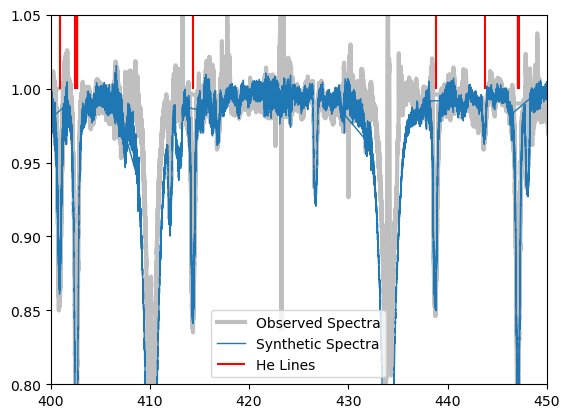

In [8]:

plt.plot(data.wl,data.specI,label='Observed Spectra',color='grey',alpha=0.5,linewidth=3)
plt.plot(synth.wl,synth.specI,label='Synthetic Spectra',color='C0',alpha=1,linewidth=1)
#plt.plot(hybridFull[8][0],hybridFull[8][1], label='Model Spectra (Full Hybrid)')
#plt.plot(toto[8][0],toto[8][1], label='Model Spectra (SuperClean Observed)')
#plt.plot(toto2[8][0],toto2[8][1], label='Model Spectra (SuperClean Hybrid)')


plt.vlines(mask[np.where((mask.iuse==1) & (mask.element==2.))].wl,1,1.05,label='He Lines',color='Red')
plt.legend()
plt.xlim(400,450)
plt.ylim(0.8,1.05)

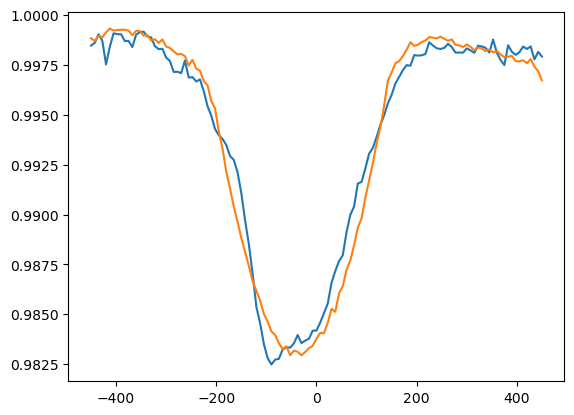

In [9]:
plt.plot(AUO.vel,AUO.specI)
plt.plot(AUH.vel,AUH.specI)

## 2. All bad stars

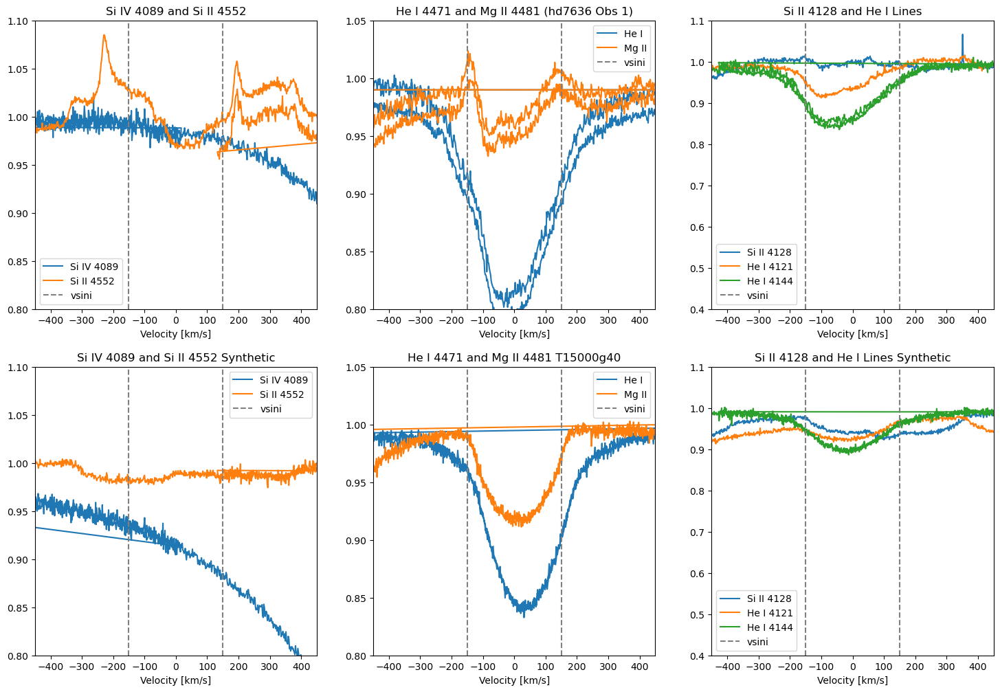

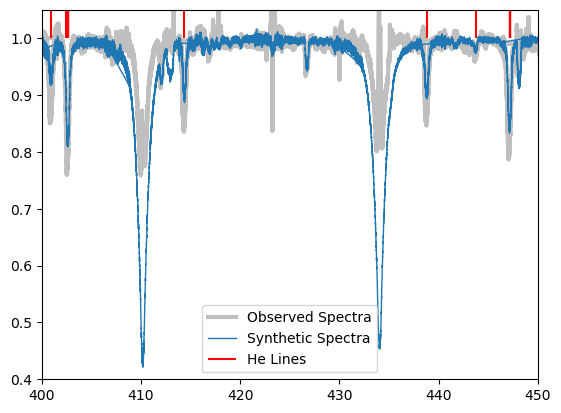

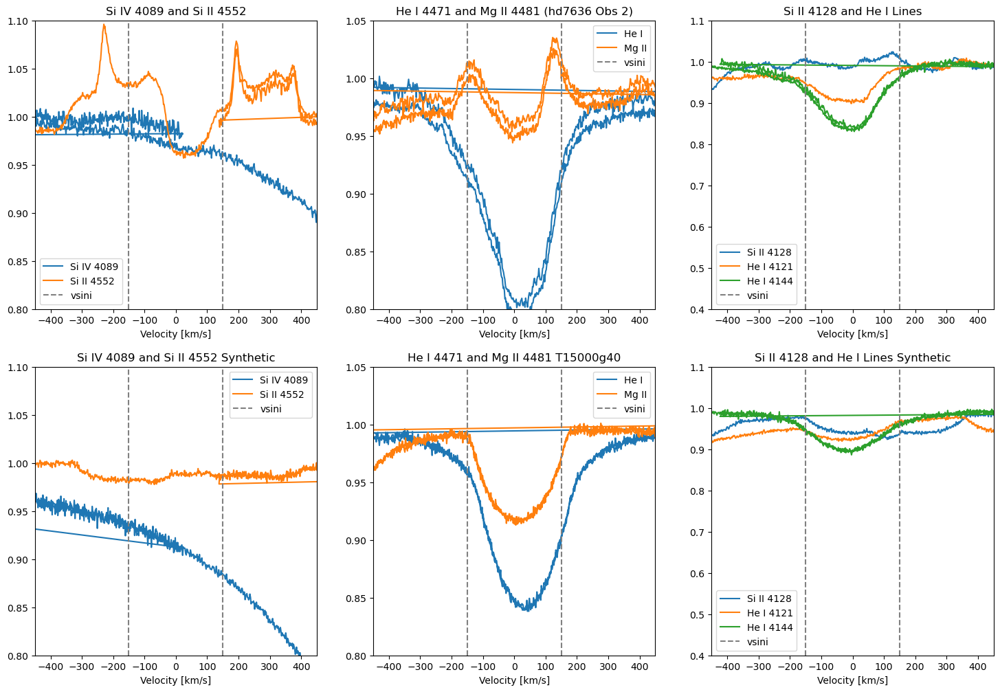

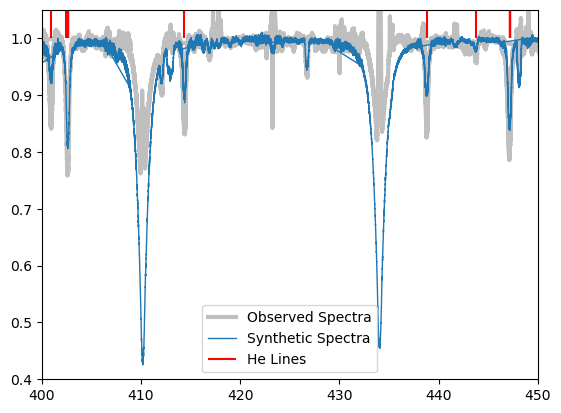

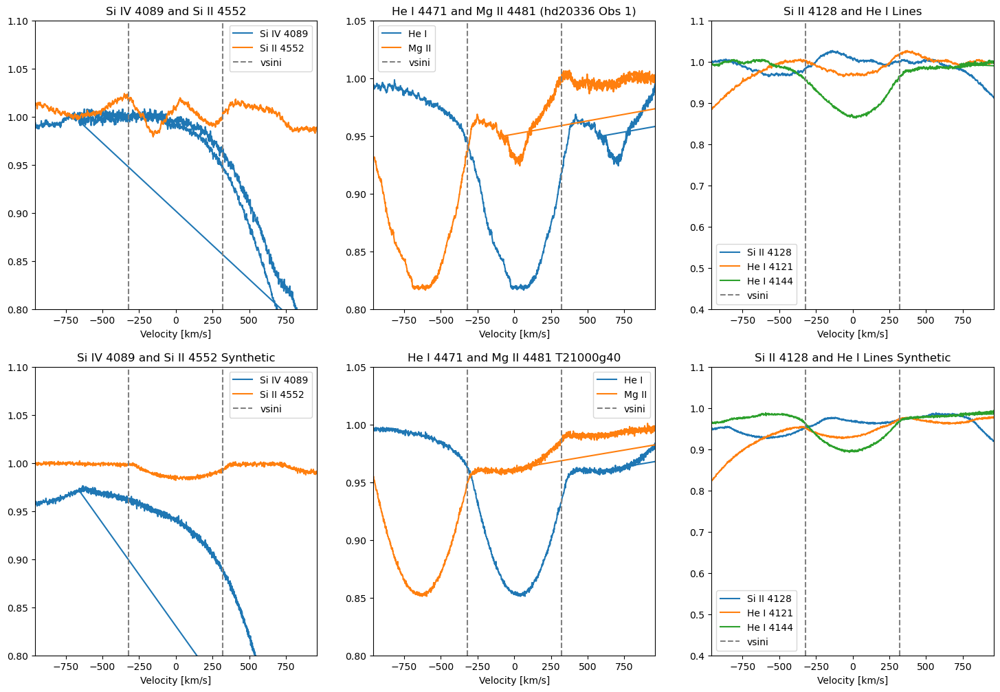

...

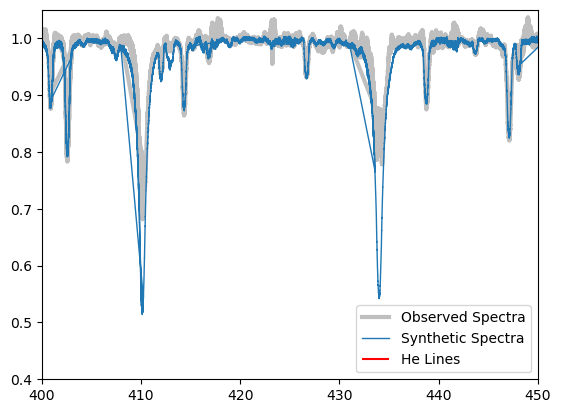

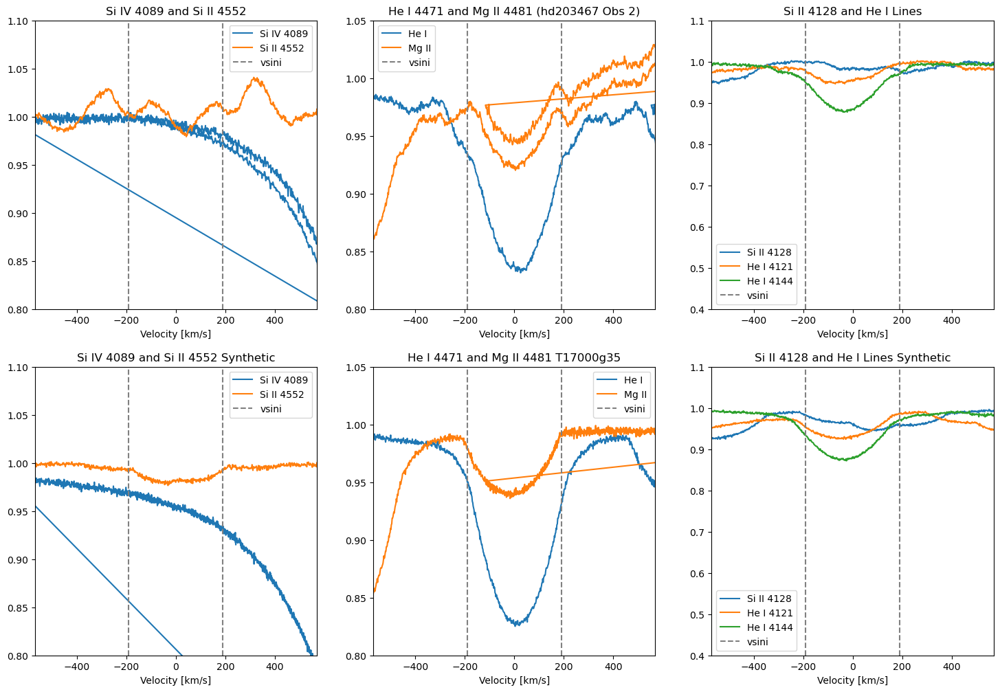

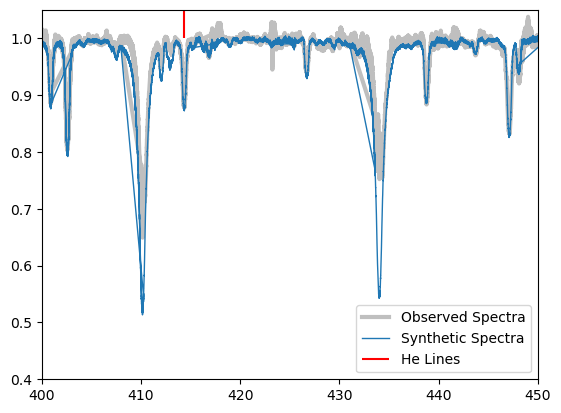

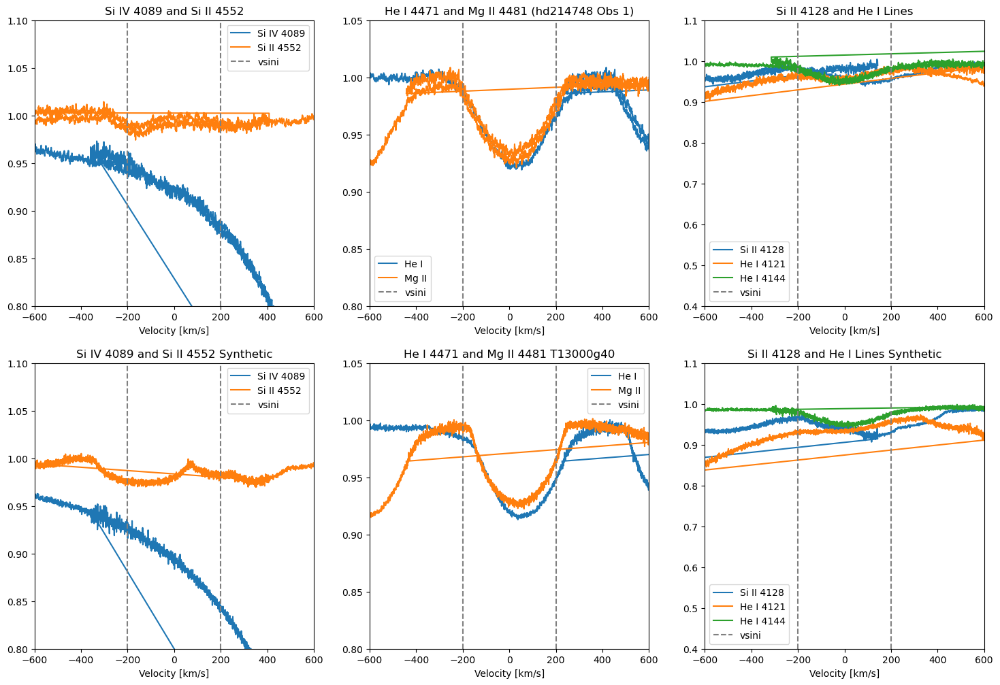

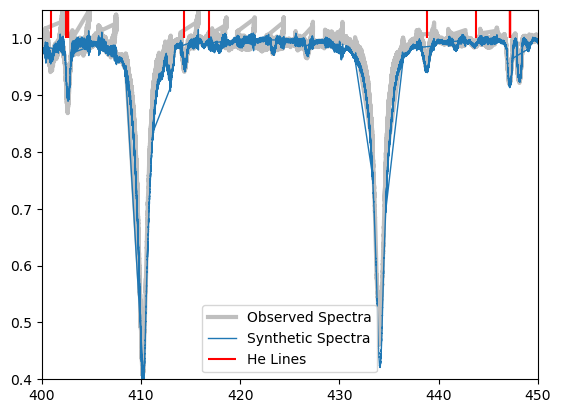

In [9]:
models1=['normalized_SuperCleanAsif+tellClean','hybrid_SuperCleanAsif+tellClean','hybrid_maskdepth0.02_tellClean']

stars=['hd7636','hd20336','hd37202','hd48917','hd58050','hd58343','hd71072','hd72067','hd89884','hd120324','hd173948','hd181231','hd198183','hd203467','hd214748']

for j in range(len(stars)):
    star=stars[j]
    ModelCode=StarData['ModelCode'][np.where(StarData['Name']==star)[0][0]]
    for i in range(len(np.where(Observations['Name']==star.lower())[0])):
        df = pd.read_csv('{}03-LSD-calculations/LSD/Params-LSDProfiles-CalculatedByPython.csv'.format(path))
        velS = df["VelStart"][np.where(StarData['Name']==star)[0][0]]
        velE = df["VelEnd"][np.where(StarData['Name']==star)[0][0]]
        velP = df["VelPixel"][np.where(StarData['Name']==star)[0][0]]


        if StarData['vsini-estimate'][np.where(StarData['Name']==star)[0][0]]=='very bad' or np.isnan(StarData['vsini-estimate'][np.where(StarData['Name']==star)[0][0]]):
            vsini=StarData['Adopted-vsini'][np.where(StarData['Name']==star)[0][0]]
        else: 
            vsini=StarData['vsini-estimate'][np.where(StarData['Name']==star)[0][0]]
        #get Full Mask with all lines
        AFfile_mask='{}02-Mask-calculations/MaskCleaning/depth0.02_tellClean/{}_depth0.02.mask'.format(path,ModelCode)
        AFmask = pol.read_mask(fname=AFfile_mask)
        #get SuperClean Mask with all Lines
        AUfile_mask='{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}.mask'.format(path,star,i+1)
        AUmask = pol.read_mask(fname=AUfile_mask)

        #get observed spectra file
        file = '{}00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(path,star,i+1)
        data = pol.read_spectrum(file)
        #get synthetic spectra file
        synthfile = '{}01-Synth-calculations/Synth-hybrid-spectra/{}_{}_noise.s'.format(path,star,i+1)
        synth = pol.read_spectrum(synthfile)

        fig, ax = plt.subplots(2,3,sharex=False,figsize=(18,12))

        SiIV4089 = 408.9 * u.nm
        SiIVvel = ((data.wl*u.nm - SiIV4089)/SiIV4089 * const.c).to(u.km/u.s)

        SiII4552 = 455.2*u.nm
        vel6=((data.wl*u.nm - SiII4552)/SiII4552 * const.c).to(u.km/u.s)

        ax[0,0].plot(SiIVvel,data.specI,label='Si IV 4089')
        ax[0,0].plot(vel6,data.specI,label='Si II 4552')
        ax[0,0].set_xlim(-3*vsini,3*vsini)
        ax[0,0].set_ylim(0.8,1.1)
        ax[0,0].vlines([-vsini,vsini],0.8,1.1,linestyle='--',color='grey',label='vsini')
        ax[0,0].legend()
        ax[0,0].set_title('Si IV 4089 and Si II 4552')
        ax[0,0].set_xlabel('Velocity [km/s]')

        SiIVvels = ((synth.wl*u.nm - SiIV4089)/SiIV4089 * const.c).to(u.km/u.s)

        vel6s=((synth.wl*u.nm - SiII4552)/SiII4552 * const.c).to(u.km/u.s)

        ax[1,0].plot(SiIVvels,synth.specI,label='Si IV 4089')
        ax[1,0].plot(vel6s,synth.specI,label='Si II 4552')
        ax[1,0].set_xlim(-3*vsini,3*vsini)
        ax[1,0].set_ylim(0.8,1.1)
        ax[1,0].vlines([-vsini,vsini],0.8,1.1,linestyle='--',color='grey',label='vsini')
        ax[1,0].legend()
        ax[1,0].set_title('Si IV 4089 and Si II 4552 Synthetic')
        ax[1,0].set_xlabel('Velocity [km/s]')

        HeI4471 = 447.1 *u.nm
        MgII4481 = 448.1 *u.nm
        HeIvel = ((data.wl*u.nm - HeI4471)/HeI4471 * const.c).to(u.km/u.s)
        MgIIvel = ((data.wl*u.nm - MgII4481)/MgII4481 * const.c).to(u.km/u.s)

        ax[0,1].plot(HeIvel,data.specI,label='He I')
        ax[0,1].plot(MgIIvel,data.specI,label='Mg II')
        ax[0,1].set_xlim(-3*vsini,3*vsini)
        ax[0,1].set_ylim(0.8,1.05)
        ax[0,1].vlines([-vsini,vsini],0.8,1.05,linestyle='--',color='grey',label='vsini')
        ax[0,1].legend()
        ax[0,1].set_title('He I 4471 and Mg II 4481 ({} Obs {})'.format(star,i+1))
        ax[0,1].set_xlabel('Velocity [km/s]')

        HeIvels = ((synth.wl*u.nm - HeI4471)/HeI4471 * const.c).to(u.km/u.s)
        MgIIvels = ((synth.wl*u.nm - MgII4481)/MgII4481 * const.c).to(u.km/u.s)

        ax[1,1].plot(HeIvels,synth.specI,label='He I')
        ax[1,1].plot(MgIIvels,synth.specI,label='Mg II')
        ax[1,1].set_xlim(-3*vsini,3*vsini)
        ax[1,1].set_ylim(0.8,1.05)
        ax[1,1].vlines([-vsini,vsini],0.8,1.05,linestyle='--',color='grey',label='vsini')
        ax[1,1].legend()
        ax[1,1].set_title('He I 4471 and Mg II 4481 {}'.format(ModelCode))
        ax[1,1].set_xlabel('Velocity [km/s]')


        HeI4009 = 400.9*u.nm
        HeI4026 = 402.6*u.nm
        HeI4121 = 412.1*u.nm
        HeI4144 = 414.4*u.nm
        HeI4924 = 492.4*u.nm

        SiII4128 = 412.8*u.nm


        vel=((data.wl*u.nm - HeI4009)/HeI4009 * const.c).to(u.km/u.s)
        vel1=((data.wl*u.nm - HeI4026)/HeI4026 * const.c).to(u.km/u.s)
        vel2=((data.wl*u.nm - HeI4121)/HeI4121 * const.c).to(u.km/u.s)
        vel3=((data.wl*u.nm - HeI4144)/HeI4144 * const.c).to(u.km/u.s)
        vel4=((data.wl*u.nm - HeI4924)/HeI4924 * const.c).to(u.km/u.s)

        vel5=((data.wl*u.nm - SiII4128)/SiII4128 * const.c).to(u.km/u.s)

        ax[0,2].plot(vel5,data.specI,label='Si II 4128')
        ax[0,2].plot(vel2,data.specI,label='He I 4121')
        ax[0,2].plot(vel3,data.specI,label='He I 4144')

        ax[0,2].set_xlim(-3*vsini,3*vsini)
        ax[0,2].set_ylim(0.4,1.1)
        ax[0,2].vlines([-vsini,vsini],0.4,1.1,linestyle='--',color='grey',label='vsini')
        ax[0,2].legend()
        ax[0,2].set_title('Si II 4128 and He I Lines')
        ax[0,2].set_xlabel('Velocity [km/s]')


        vels=((synth.wl*u.nm - HeI4009)/HeI4009 * const.c).to(u.km/u.s)
        vel1s=((synth.wl*u.nm - HeI4026)/HeI4026 * const.c).to(u.km/u.s)
        vel2s=((synth.wl*u.nm - HeI4121)/HeI4121 * const.c).to(u.km/u.s)
        vel3s=((synth.wl*u.nm - HeI4144)/HeI4144 * const.c).to(u.km/u.s)
        vel4s=((synth.wl*u.nm - HeI4924)/HeI4924 * const.c).to(u.km/u.s)

        vel5s=((synth.wl*u.nm - SiII4128)/SiII4128 * const.c).to(u.km/u.s)

        ax[1,2].plot(vel5s,synth.specI,label='Si II 4128')
        ax[1,2].plot(vel2s,synth.specI,label='He I 4121')
        ax[1,2].plot(vel3s,synth.specI,label='He I 4144')
        ax[1,2].set_xlim(-3*vsini,3*vsini)
        ax[1,2].set_ylim(0.4,1.1)
        ax[1,2].vlines([-vsini,vsini],0.4,1.1,linestyle='--',color='grey',label='vsini')
        ax[1,2].legend()
        ax[1,2].set_title('Si II 4128 and He I Lines Synthetic')
        ax[1,2].set_xlabel('Velocity [km/s]')
        plt.show()

        
        plt.plot(data.wl,data.specI,label='Observed Spectra',color='grey',alpha=0.5,linewidth=3)
        plt.plot(synth.wl,synth.specI,label='Synthetic Spectra',color='C0',alpha=1,linewidth=1)

        plt.vlines(AUmask[np.where((AUmask.iuse==1) & (AUmask.element==2.))].wl,1,1.05,label='He Lines',color='Red')
        plt.legend()
        plt.xlim(400,450)
        plt.ylim(0.4,1.05)
        plt.show()


In [39]:
star='hd89884'
i=0
AUfile_mask='{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}.mask'.format(path,star,i+1)
AUmask = pol.read_mask(fname=AUfile_mask)
AUmask.wl[np.where((AUmask.wl>=408) & (AUmask.wl<=408.9) )]

array([408.0089, 408.0782, 408.1007, 408.102 , 408.1099, 408.1504,
       408.1989, 408.2484, 408.2769, 408.4647, 408.4829, 408.5112,
       408.6586, 408.8611, 408.8713, 408.8862])